## Importing Necessary Libaries

In [1]:
#Importing the required libraries 
import numpy as np #for linear algebra/data preprocessing
import pandas as pd #for data preprocessing
import matplotlib.pyplot as plt #For visualization
import seaborn as sns #for visualization
from pandas_profiling import ProfileReport
%matplotlib inline  
from datetime import datetime 
import warnings 
from sklearn.preprocessing import LabelEncoder,OneHotEncoder # for encoding categorical variables

## Loading and Description of Data

In [2]:
data_train= pd.read_csv("train.csv")

data_test= pd.read_csv("test.csv") 

In [3]:
data_train.head() 

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response
0,ID_4A9AR6FQ,1955,Graduation,Divorced,77504.4,1,1,22-06-2014,56,2,...,6,20,3,0,0,0,0,0,0,0
1,ID_X28T3VEK,1958,Graduation,Together,56784.0,0,1,01-08-2013,17,6,...,15,19,6,0,0,0,0,0,0,0
2,ID_AWXARH57,1962,Graduation,Single,103714.8,0,0,21-11-2013,17,0,...,18,37,2,0,0,0,1,0,0,1
3,ID_FQVZHE81,1979,2n Cycle,Single,46311.6,1,0,13-09-2013,49,3,...,24,24,8,0,0,0,0,0,0,0
4,ID_QVLWGPRN,1959,Graduation,Married,87486.0,0,0,21-01-2014,59,1,...,165,203,1,0,0,0,1,0,0,0


In [4]:
data_test.head()

,ID,Year_of_Birth,Education_Level,Marital_Status,Disposable_Income,No_of_Kids_in_home,No_of_Teen_in_home,Date_Customer,Recency,Discounted_Purchases,...,Amount_on_FishProducts,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain
0,ID_ZPMABNVX,1954,Graduation,Single,48556.8,0,1,11-01-2013,85,6,...,7,23,41,8,0,0,0,0,0,0
1,ID_WFE91NAA,1961,Graduation,Widow,57499.2,0,1,22-11-2012,79,5,...,0,0,75,6,0,1,0,0,0,0
2,ID_JV11RBRK,1973,Basic,Married,17025.6,0,0,28-02-2013,47,1,...,16,12,27,6,0,0,0,0,0,0
3,ID_6B7SVKY9,1970,Graduation,Together,91983.6,0,0,16-08-2013,98,1,...,219,189,126,2,0,0,1,1,0,0
4,ID_GOVUZ545,1959,Graduation,Together,78235.2,0,2,25-07-2013,41,2,...,12,0,200,5,1,0,0,0,0,0


In [5]:
#Create submission file using an empty/dummy dataframe
sub_file = pd.DataFrame(columns=['ID', 'Response'])
sub_file.head()   

,ID,Response


In [6]:
#Save test ID in a copy for creating submission file later
sub_file.ID = data_test.ID
sub_file.head()

,ID,Response
0,ID_ZPMABNVX,NaN
1,ID_WFE91NAA,NaN
2,ID_JV11RBRK,NaN
3,ID_6B7SVKY9,NaN
4,ID_GOVUZ545,NaN


In [7]:
data_train.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1568 entries, 0 to 1567
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       1568 non-null   object 
 1   Year_of_Birth            1568 non-null   int64  
 2   Education_Level          1568 non-null   object 
 3   Marital_Status           1568 non-null   object 
 4   Disposable_Income        1552 non-null   float64
 5   No_of_Kids_in_home       1568 non-null   int64  
 6   No_of_Teen_in_home       1568 non-null   int64  
 7   Date_Customer            1568 non-null   object 
 8   Recency                  1568 non-null   int64  
 9   Discounted_Purchases     1568 non-null   int64  
 10  WebPurchases             1568 non-null   int64  
 11  CatalogPurchases         1568 non-null   int64  
 12  StorePurchases           1568 non-null   int64  
 13  Amount_on_Wines          1568 non-null   int64  
 14  Amount_on_Fruits        

In [8]:
data_train.profile_report()

In [9]:
data_train.nunique() 

ID                         1568
Year_of_Birth                56
Education_Level               5
Marital_Status                8
Disposable_Income          1431
No_of_Kids_in_home            3
No_of_Teen_in_home            3
Date_Customer               619
Recency                     100
Discounted_Purchases         15
WebPurchases                 14
CatalogPurchases             14
StorePurchases               14
Amount_on_Wines             643
Amount_on_Fruits            148
Amount_on_MeatProducts      486
Amount_on_FishProducts      170
Amount_on_SweetProducts     163
Amount_on_GoldProds         199
WebVisitsMonth               16
Cmp3Accepted                  2
Cmp4Accepted                  2
Cmp5Accepted                  2
Cmp1Accepted                  2
Cmp2Accepted                  2
Any_Complain                  2
Response                      2
dtype: int64

## Handling Missing Data

In [10]:
data_train.isnull().sum()

ID                          0
Year_of_Birth               0
Education_Level             0
Marital_Status              0
Disposable_Income          16
No_of_Kids_in_home          0
No_of_Teen_in_home          0
Date_Customer               0
Recency                     0
Discounted_Purchases        0
WebPurchases                0
CatalogPurchases            0
StorePurchases              0
Amount_on_Wines             0
Amount_on_Fruits            0
Amount_on_MeatProducts      0
Amount_on_FishProducts      0
Amount_on_SweetProducts     0
Amount_on_GoldProds         0
WebVisitsMonth              0
Cmp3Accepted                0
Cmp4Accepted                0
Cmp5Accepted                0
Cmp1Accepted                0
Cmp2Accepted                0
Any_Complain                0
Response                    0
dtype: int64

- Missing value **imputation for numerical features** can be done **using the mean or the median**.
- **Mean** is **used to impute** the missing values for the **feature that is normally distributed**.
- **Median is used to impute** missing values in **highly skewed features**.
- **Mode** is used to impute unknown categorical data

In [11]:
median_Income = data_train.Disposable_Income.median()
data_train.Disposable_Income.fillna(median_Income, inplace = True)        

<AxesSubplot:>

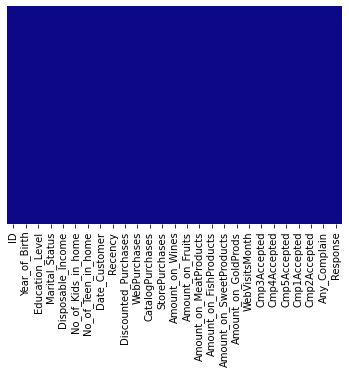

In [12]:
sns.heatmap(data_train.isnull(),yticklabels=False,cbar=False,cmap='plasma') 

## Exploring the data

In [13]:
#Drop ID from train and test
data_train.drop(['ID','Date_Customer','Disposable_Income'],axis=1, inplace=True)  
data_test.drop(['ID', 'Date_Customer','Disposable_Income'],axis=1, inplace=True)   

In [14]:
# #Convert Datetime
# data_train['Date_Customer'] = pd.to_datetime(data_train['Date_Customer'])  
# data_test['Date_Customer'] = pd.to_datetime(data_test['Date_Customer'])       

In [15]:
data_train.head(10)  

,Year_of_Birth,Education_Level,Marital_Status,No_of_Kids_in_home,No_of_Teen_in_home,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,...,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response
0,1955,Graduation,Divorced,1,1,56,2,1,1,4,...,6,20,3,0,0,0,0,0,0,0
1,1958,Graduation,Together,0,1,17,6,5,1,8,...,15,19,6,0,0,0,0,0,0,0
2,1962,Graduation,Single,0,0,17,0,7,4,7,...,18,37,2,0,0,0,1,0,0,1
3,1979,2n Cycle,Single,1,0,49,3,4,1,3,...,24,24,8,0,0,0,0,0,0,0
4,1959,Graduation,Married,0,0,59,1,3,7,9,...,165,203,1,0,0,0,1,0,0,0
5,1960,Master,Married,0,1,32,1,0,0,3,...,0,1,5,0,0,0,0,0,0,0
6,1953,Graduation,Single,0,0,94,1,6,7,8,...,14,56,3,0,0,0,0,0,0,0
7,1974,Graduation,Together,0,0,61,1,6,5,12,...,91,15,3,0,0,0,0,0,0,0
8,1966,Graduation,Together,1,1,13,1,0,0,3,...,4,8,6,0,0,0,0,0,0,0
9,1975,Graduation,Married,1,0,88,1,1,0,2,...,2,9,7,0,0,0,0,0,0,0


In [16]:
data_test.head()

,Year_of_Birth,Education_Level,Marital_Status,No_of_Kids_in_home,No_of_Teen_in_home,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,...,Amount_on_FishProducts,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain
0,1954,Graduation,Single,0,1,85,6,8,2,8,...,7,23,41,8,0,0,0,0,0,0
1,1961,Graduation,Widow,0,1,79,5,7,4,6,...,0,0,75,6,0,1,0,0,0,0
2,1973,Basic,Married,0,0,47,1,2,0,4,...,16,12,27,6,0,0,0,0,0,0
3,1970,Graduation,Together,0,0,98,1,4,7,11,...,219,189,126,2,0,0,1,1,0,0
4,1959,Graduation,Together,0,2,41,2,7,6,11,...,12,0,200,5,1,0,0,0,0,0


In [17]:
data_train.dtypes  

Year_of_Birth               int64
Education_Level            object
Marital_Status             object
No_of_Kids_in_home          int64
No_of_Teen_in_home          int64
Recency                     int64
Discounted_Purchases        int64
WebPurchases                int64
CatalogPurchases            int64
StorePurchases              int64
Amount_on_Wines             int64
Amount_on_Fruits            int64
Amount_on_MeatProducts      int64
Amount_on_FishProducts      int64
Amount_on_SweetProducts     int64
Amount_on_GoldProds         int64
WebVisitsMonth              int64
Cmp3Accepted                int64
Cmp4Accepted                int64
Cmp5Accepted                int64
Cmp1Accepted                int64
Cmp2Accepted                int64
Any_Complain                int64
Response                    int64
dtype: object

0    1329
1     239
Name: Response, dtype: int64



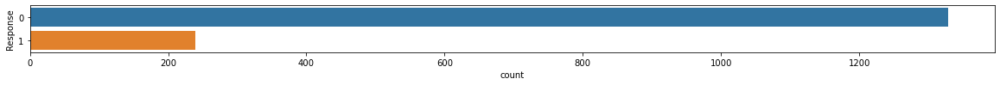

In [18]:
#How many people responded to the marketing
print(data_train.Response.value_counts())
print()

plt.figure(figsize=(20,1))
sns.countplot(y= 'Response',data=data_train)
plt.show()  

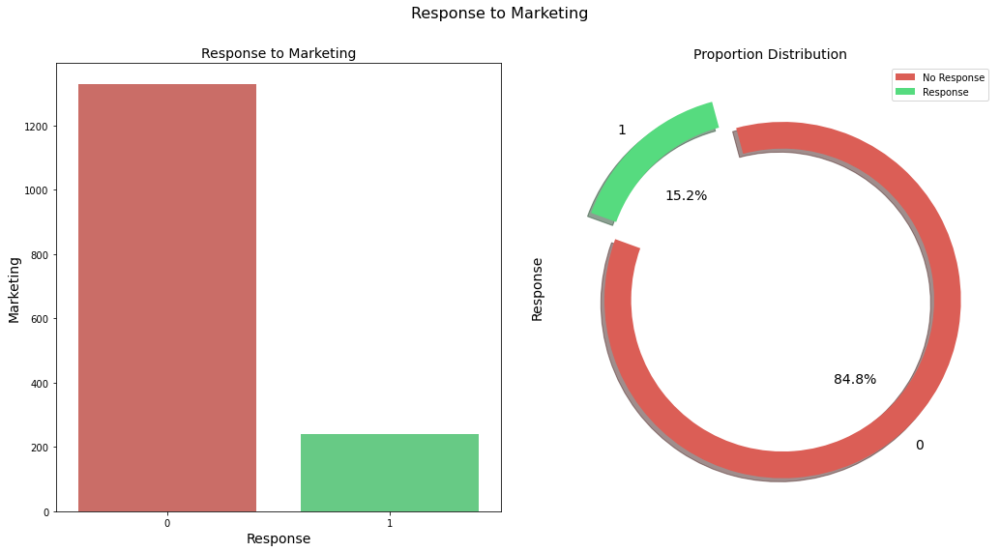

In [19]:
fig = plt.figure(figsize = [15, 8])
plt.subplot(1, 2, 1)
sns.countplot(x = 'Response', data = data_train, palette = ['#DB5E56','#56DB7F'])
plt.xlabel(xlabel = 'Response', size = 14)
plt.ylabel(ylabel = 'Marketing', size = 14)
plt.title(label = 'Response to Marketing', size = 14)

plt.subplot(1, 2, 2)
space = np.ones(2)/10
data_train['Response'].value_counts().plot(kind = 'pie', explode = space, fontsize = 14, autopct = '%3.1f%%', wedgeprops = dict(width=0.15),  
                                       shadow = True, startangle = 160, figsize = [15, 8], legend = True, colors = ['#DB5E56','#56DB7F'])
plt.legend(['No Response', 'Response'])
plt.ylabel(ylabel = 'Response', size = 14)
plt.title(label = 'Proportion Distribution', size = 14)
plt.tight_layout(pad = 3.0)
plt.suptitle(t = 'Response to Marketing', y = 1.02, size = 16)
plt.show() 

In [20]:
 from sklearn.preprocessing import LabelEncoder
le= LabelEncoder()

cat_col= ['Education_Level', 'Marital_Status']
for col in cat_col:
    data_train[col]= le.fit_transform(data_train[col])
    data_test[col]= le.fit_transform(data_test[col])   
    
data_train.head()

,Year_of_Birth,Education_Level,Marital_Status,No_of_Kids_in_home,No_of_Teen_in_home,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,...,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response
0,1955,2,2,1,1,56,2,1,1,4,...,6,20,3,0,0,0,0,0,0,0
1,1958,2,5,0,1,17,6,5,1,8,...,15,19,6,0,0,0,0,0,0,0
2,1962,2,4,0,0,17,0,7,4,7,...,18,37,2,0,0,0,1,0,0,1
3,1979,0,4,1,0,49,3,4,1,3,...,24,24,8,0,0,0,0,0,0,0
4,1959,2,3,0,0,59,1,3,7,9,...,165,203,1,0,0,0,1,0,0,0


## Feature Selection 

In [21]:
corr = data_train.corr()
corr


,Year_of_Birth,Education_Level,Marital_Status,No_of_Kids_in_home,No_of_Teen_in_home,Recency,Discounted_Purchases,WebPurchases,CatalogPurchases,StorePurchases,...,Amount_on_SweetProducts,Amount_on_GoldProds,WebVisitsMonth,Cmp3Accepted,Cmp4Accepted,Cmp5Accepted,Cmp1Accepted,Cmp2Accepted,Any_Complain,Response
Year_of_Birth,1.000000,-0.191258,-0.060465,0.242429,-0.353991,-0.014155,-0.061246,-0.165289,-0.140005,-0.159045,...,-0.044336,-0.071109,0.135795,0.067942,-0.065205,-0.012450,0.002963,0.007885,0.002978,0.012279
Education_Level,-0.191258,1.000000,0.019071,-0.037952,0.131000,0.000909,0.042843,0.068625,0.079262,0.073859,...,-0.098927,-0.080392,-0.039163,0.039540,0.039540,0.038555,0.000218,0.021730,-0.043868,0.093075
Marital_Status,-0.060465,0.019071,1.000000,-0.045743,-0.017057,0.021665,-0.038029,0.011916,0.032447,0.006786,...,0.002330,0.003213,-0.033816,-0.022140,-0.003813,0.025456,-0.024807,0.029140,-0.022478,-0.018709
No_of_Kids_in_home,0.242429,-0.037952,-0.045743,1.000000,-0.048091,0.008404,0.211293,-0.384441,-0.508997,-0.521173,...,-0.384115,-0.372180,0.450402,0.020496,-0.165929,-0.225912,-0.170760,-0.086368,0.026223,-0.108558
No_of_Teen_in_home,-0.353991,0.131000,-0.017057,-0.048091,1.000000,0.014712,0.373262,0.155173,-0.088757,0.073129,...,-0.140542,-0.013651,0.125594,-0.057385,0.055496,-0.209937,-0.158758,-0.009915,0.006894,-0.156209
Recency,-0.014155,0.000909,0.021665,0.008404,0.014712,1.000000,-0.006311,-0.026068,0.029136,-0.008498,...,0.034841,-0.000920,-0.022179,-0.018657,0.004643,0.005828,-0.040377,-0.028077,0.020208,-0.201654
Discounted_Purchases,-0.061246,0.042843,-0.038029,0.211293,0.373262,-0.006311,1.000000,0.204052,0.026556,0.058702,...,-0.102849,0.046953,0.333250,-0.037245,0.019819,-0.191230,-0.121472,-0.028915,-0.013818,0.000951
WebPurchases,-0.165289,0.068625,0.011916,-0.384441,0.155173,-0.026068,0.204052,1.000000,0.361998,0.518604,...,0.394216,0.419859,-0.088528,0.029988,0.128313,0.142003,0.145100,0.024543,-0.015261,0.165538
CatalogPurchases,-0.140005,0.079262,0.032447,-0.508997,-0.088757,0.029136,0.026556,0.361998,1.000000,0.497271,...,0.476969,0.429251,-0.525378,0.098568,0.126016,0.340899,0.297788,0.094675,-0.024632,0.221534
StorePurchases,-0.159045,0.073859,0.006786,-0.521173,0.073129,-0.008498,0.058702,0.518604,0.497271,1.000000,...,0.440027,0.407657,-0.426029,-0.058922,0.172418,0.233461,0.202406,0.088803,-0.013259,0.061446


Text(0.5, 1.0, 'Correlation between features')

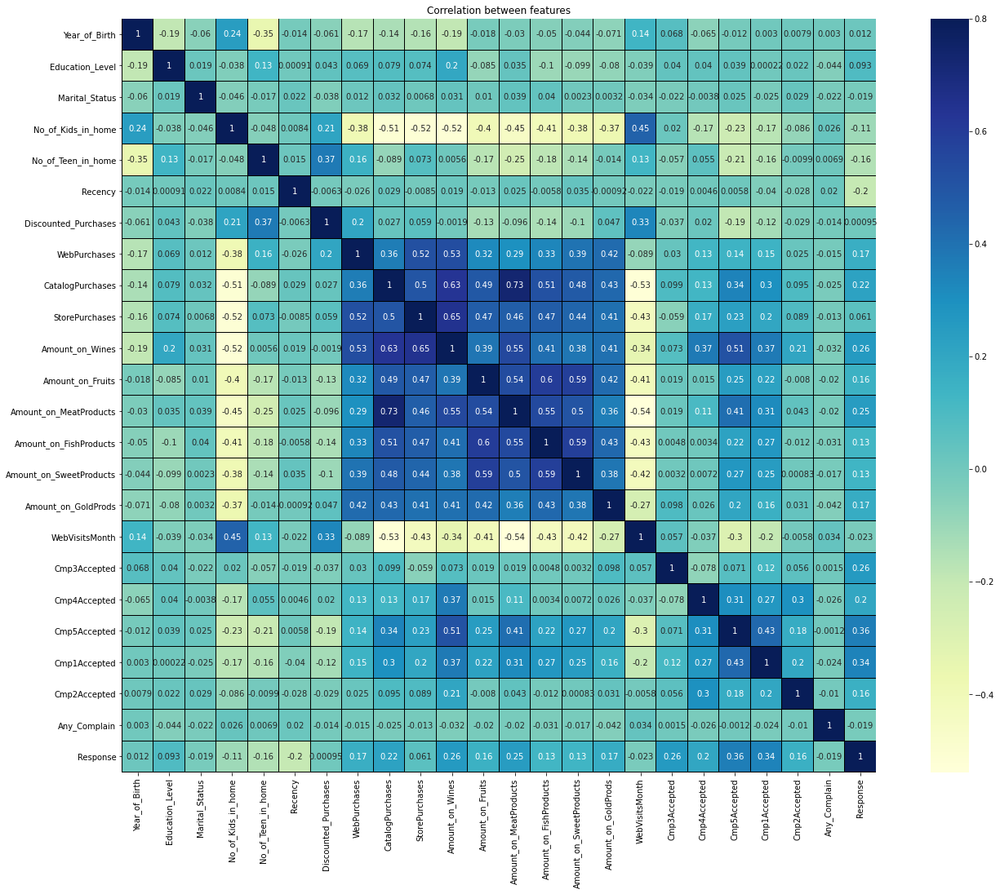

In [22]:
corr = data_train.corr()
plt.subplots(figsize=(24,17))
sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='YlGnBu',linecolor ='black')
plt.title('Correlation between features') 

In [23]:
#Correlation with output variable
cor_target = abs(corr["Response"])
#Selecting highly correlated features
relevant_features = cor_target[cor_target>0.2]
relevant_features 

Recency                   0.201654
CatalogPurchases          0.221534
Amount_on_Wines           0.259173
Amount_on_MeatProducts    0.247182
Cmp3Accepted              0.257106
Cmp4Accepted              0.202437
Cmp5Accepted              0.357647
Cmp1Accepted              0.344083
Response                  1.000000
Name: Response, dtype: float64

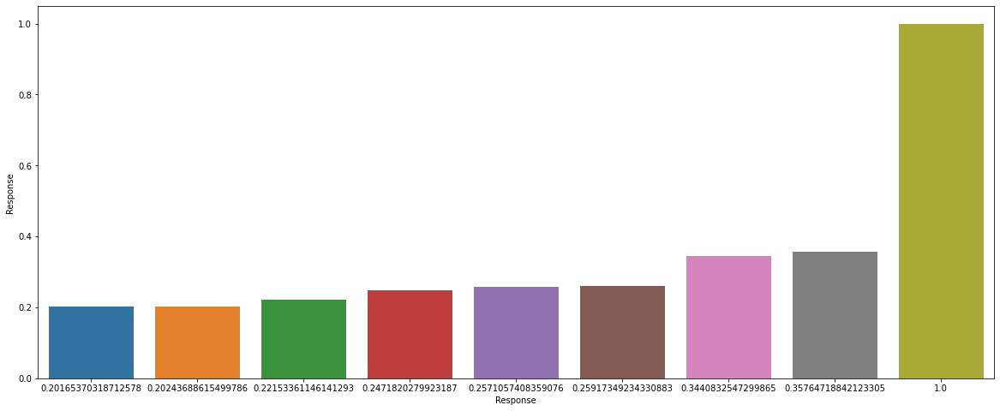

In [24]:
plt.figure(figsize=(20, 8))
importance =relevant_features
sns.barplot(x=importance, y=cor_target)
plt.show()  

#### Observation:

-We can see that 'Cmp3Accepted', 'Cmp4Accepted', 'Cmp5Accepted', 'Cmp1Accepted', 'Cmp2Accepted', 'Amount_on_Wines' and 'CatalogPurchases' are more correlated to 'Response'

### Splitting the data

In [25]:
X= data_train.drop('Response', axis=1)
y= data_train['Response']

### Transformations for the categorical and numeric variables

In [26]:
#separate catgorical and numerical column
#categ_cols == categorical columns . Date column excluded
categ_cols = data_train.select_dtypes(include=['object', 'category']).columns 

# num column == numerical columns + date column included
num_cols = [col for col in data_train.columns if col not in categ_cols]
print(f'The Categorical Columns are: {categ_cols}')
print(f'The Numerical Columns are: {num_cols}')  

The Categorical Columns are: Index([], dtype='object')
The Numerical Columns are: ['Year_of_Birth', 'Education_Level', 'Marital_Status', 'No_of_Kids_in_home', 'No_of_Teen_in_home', 'Recency', 'Discounted_Purchases', 'WebPurchases', 'CatalogPurchases', 'StorePurchases', 'Amount_on_Wines', 'Amount_on_Fruits', 'Amount_on_MeatProducts', 'Amount_on_FishProducts', 'Amount_on_SweetProducts', 'Amount_on_GoldProds', 'WebVisitsMonth', 'Cmp3Accepted', 'Cmp4Accepted', 'Cmp5Accepted', 'Cmp1Accepted', 'Cmp2Accepted', 'Any_Complain', 'Response']


In [27]:
#checking the target column
print(f'Unique entries in the Target column in  is: {data_train.Response.nunique()}') 
print(f'and the unique entries are: {data_train.Response.unique()}')

Unique entries in the Target column in  is: 2
and the unique entries are: [0 1]


### To make our calculations more straightforward, we will scale and transform our data values to fit using the MinMax Scaler.

In [28]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3, random_state = 101)
print('Training Data Shape:', X_train.shape, y_train.shape)
print('Testing Data Shape:', X_test.shape, y_test.shape)

Training Data Shape: (1097, 23) (1097,)
Testing Data Shape: (471, 23) (471,)


In [29]:
from sklearn.preprocessing import MinMaxScaler 
mmscaler = MinMaxScaler()
X_train_norm = mmscaler.fit_transform(X_train)
X_test_norm = mmscaler.transform(X_test)

## Model Development & Evaluation

### Gradient Boost Classifier 

In [30]:
from sklearn.ensemble import GradientBoostingClassifier
GBC=GradientBoostingClassifier()
GBC.fit(X_train,y_train) 

GradientBoostingClassifier()

In [31]:
GBC_prediction=GBC.predict(X_test)

#### Using the predicted values(GBC_prediction) and our actual values (y_test), we can create a confusion matrix with the confusion_matrix function.
###### Then, using the seaborn plot of our confusion_matrix function, we can get the True Positive, True Negative, False Positive, and False Negative values

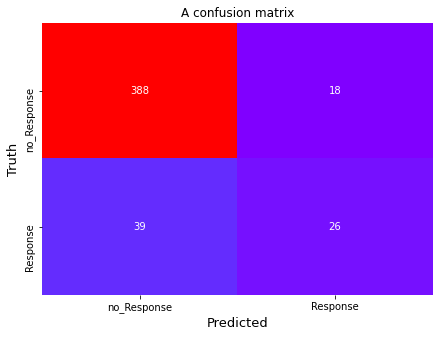

In [32]:
def ConfusionMatrix(ytest, ypred, label = ["no_Response", "Response"]):
    "A beautiful confusion matrix function to check the model performance"
    from sklearn.metrics import confusion_matrix
    import seaborn as sns
    cm = confusion_matrix(ytest, ypred)
    plt.figure(figsize=(7, 5))
    sns.heatmap(cm, annot = True, cbar = False, fmt = 'd', cmap = 'rainbow')
    plt.xlabel('Predicted', fontsize = 13)
    plt.xticks([0.5, 1.5], label)
    plt.yticks([0.5, 1.5], label)
    plt.ylabel('Truth', fontsize = 13)
    plt.title('A confusion matrix'); 
ConfusionMatrix(y_test, GBC_prediction,label= ["no_Response", "Response"]) 

In [33]:
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
confusionmatrix=confusion_matrix(y_test,GBC_prediction)
confusionmatrix 

array([[388,  18],
       [ 39,  26]], dtype=int64)

In [34]:
from sklearn import metrics #for modal evaluation
print(metrics.classification_report(y_test, GBC_prediction, digits=3, zero_division = 1))

              precision    recall  f1-score   support

           0      0.909     0.956     0.932       406
           1      0.591     0.400     0.477        65

    accuracy                          0.879       471
   macro avg      0.750     0.678     0.704       471
weighted avg      0.865     0.879     0.869       471



In [35]:
cm = confusion_matrix(y_test, GBC_prediction)
accuracyscore=accuracy_score(y_test,GBC_prediction)
accuracyscore
print(accuracyscore*100)

87.89808917197452


In [36]:
from sklearn.ensemble import AdaBoostClassifier
# Create adaboost classifer object 
abc = AdaBoostClassifier(n_estimators=50, learning_rate=1) 
# Train Adaboost Classifer
model = abc.fit(X_train, y_train) 
#Predict the response for test dataset 
y_pred = model.predict(X_test)
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8747346072186837


### Random Forest Classifier

In [37]:
from sklearn.ensemble import RandomForestClassifier
Rand_forest = RandomForestClassifier(n_estimators=100)
Rand_forest.fit(X_train, y_train) 

RandomForestClassifier()

In [38]:
y_pred = Rand_forest.predict(X_test)
print(metrics.classification_report(y_test, y_pred.round(), digits=3))

              precision    recall  f1-score   support

           0      0.909     0.961     0.934       406
           1      0.619     0.400     0.486        65

    accuracy                          0.883       471
   macro avg      0.764     0.680     0.710       471
weighted avg      0.869     0.883     0.872       471



In [39]:
accuracyscore=accuracy_score(y_test, y_pred)
accuracyscore
print(accuracyscore*100) 

88.32271762208069


### CatBoost

In [40]:
import lightgbm as lgb  
from catboost import CatBoostClassifier 

In [41]:
#Creating model 
cat_model=CatBoostClassifier()

#Training Catboost Model on train set
cat_model.fit(X_train,y_train)

#Predictiing on Test Set
y_pred_cat=cat_model.predict(X_test)

Learning rate set to 0.010718
0:	learn: 0.6841372	total: 225ms	remaining: 3m 45s
1:	learn: 0.6753476	total: 233ms	remaining: 1m 56s
2:	learn: 0.6676676	total: 239ms	remaining: 1m 19s
3:	learn: 0.6593802	total: 245ms	remaining: 1m
4:	learn: 0.6515348	total: 250ms	remaining: 49.8s
5:	learn: 0.6439439	total: 256ms	remaining: 42.4s
6:	learn: 0.6366314	total: 261ms	remaining: 37s
7:	learn: 0.6298093	total: 266ms	remaining: 32.9s
8:	learn: 0.6210171	total: 270ms	remaining: 29.7s
9:	learn: 0.6153057	total: 274ms	remaining: 27.2s
10:	learn: 0.6082315	total: 279ms	remaining: 25.1s
11:	learn: 0.6016362	total: 283ms	remaining: 23.3s
12:	learn: 0.5944658	total: 288ms	remaining: 21.8s
13:	learn: 0.5866945	total: 292ms	remaining: 20.6s
14:	learn: 0.5802760	total: 297ms	remaining: 19.5s
15:	learn: 0.5736153	total: 302ms	remaining: 18.6s
16:	learn: 0.5677735	total: 306ms	remaining: 17.7s
17:	learn: 0.5606379	total: 311ms	remaining: 16.9s
18:	learn: 0.5558258	total: 315ms	remaining: 16.3s
19:	learn: 0.

178:	learn: 0.2651321	total: 1.05s	remaining: 4.84s
179:	learn: 0.2643661	total: 1.06s	remaining: 4.83s
180:	learn: 0.2638450	total: 1.06s	remaining: 4.82s
181:	learn: 0.2632198	total: 1.07s	remaining: 4.8s
182:	learn: 0.2628658	total: 1.07s	remaining: 4.79s
183:	learn: 0.2624348	total: 1.08s	remaining: 4.78s
184:	learn: 0.2618932	total: 1.08s	remaining: 4.77s
185:	learn: 0.2614291	total: 1.09s	remaining: 4.76s
186:	learn: 0.2609582	total: 1.09s	remaining: 4.75s
187:	learn: 0.2602802	total: 1.1s	remaining: 4.74s
188:	learn: 0.2597471	total: 1.1s	remaining: 4.73s
189:	learn: 0.2594375	total: 1.11s	remaining: 4.72s
190:	learn: 0.2588241	total: 1.11s	remaining: 4.71s
191:	learn: 0.2587064	total: 1.11s	remaining: 4.69s
192:	learn: 0.2582829	total: 1.12s	remaining: 4.68s
193:	learn: 0.2576751	total: 1.12s	remaining: 4.67s
194:	learn: 0.2570843	total: 1.13s	remaining: 4.66s
195:	learn: 0.2565196	total: 1.13s	remaining: 4.65s
196:	learn: 0.2559676	total: 1.14s	remaining: 4.64s
197:	learn: 0.2

364:	learn: 0.1988788	total: 1.91s	remaining: 3.32s
365:	learn: 0.1986588	total: 1.91s	remaining: 3.31s
366:	learn: 0.1984728	total: 1.92s	remaining: 3.3s
367:	learn: 0.1981267	total: 1.92s	remaining: 3.3s
368:	learn: 0.1979257	total: 1.93s	remaining: 3.29s
369:	learn: 0.1975279	total: 1.93s	remaining: 3.29s
370:	learn: 0.1972312	total: 1.94s	remaining: 3.28s
371:	learn: 0.1970059	total: 1.94s	remaining: 3.28s
372:	learn: 0.1967388	total: 1.95s	remaining: 3.27s
373:	learn: 0.1965004	total: 1.95s	remaining: 3.26s
374:	learn: 0.1962535	total: 1.95s	remaining: 3.26s
375:	learn: 0.1959301	total: 1.96s	remaining: 3.25s
376:	learn: 0.1957389	total: 1.96s	remaining: 3.24s
377:	learn: 0.1954968	total: 1.97s	remaining: 3.24s
378:	learn: 0.1952640	total: 1.97s	remaining: 3.23s
379:	learn: 0.1951031	total: 1.98s	remaining: 3.22s
380:	learn: 0.1948761	total: 1.98s	remaining: 3.22s
381:	learn: 0.1946575	total: 1.99s	remaining: 3.21s
382:	learn: 0.1943063	total: 1.99s	remaining: 3.21s
383:	learn: 0.

552:	learn: 0.1597650	total: 2.75s	remaining: 2.22s
553:	learn: 0.1596006	total: 2.75s	remaining: 2.22s
554:	learn: 0.1593336	total: 2.76s	remaining: 2.21s
555:	learn: 0.1591444	total: 2.76s	remaining: 2.21s
556:	learn: 0.1589962	total: 2.77s	remaining: 2.2s
557:	learn: 0.1588464	total: 2.77s	remaining: 2.2s
558:	learn: 0.1585737	total: 2.78s	remaining: 2.19s
559:	learn: 0.1584463	total: 2.78s	remaining: 2.19s
560:	learn: 0.1582474	total: 2.79s	remaining: 2.18s
561:	learn: 0.1580697	total: 2.79s	remaining: 2.18s
562:	learn: 0.1578455	total: 2.8s	remaining: 2.17s
563:	learn: 0.1575957	total: 2.8s	remaining: 2.17s
564:	learn: 0.1573162	total: 2.81s	remaining: 2.16s
565:	learn: 0.1571428	total: 2.81s	remaining: 2.15s
566:	learn: 0.1568775	total: 2.81s	remaining: 2.15s
567:	learn: 0.1566769	total: 2.82s	remaining: 2.14s
568:	learn: 0.1565011	total: 2.82s	remaining: 2.14s
569:	learn: 0.1563370	total: 2.83s	remaining: 2.13s
570:	learn: 0.1562696	total: 2.83s	remaining: 2.13s
571:	learn: 0.15

740:	learn: 0.1295995	total: 3.6s	remaining: 1.26s
741:	learn: 0.1294786	total: 3.6s	remaining: 1.25s
742:	learn: 0.1292998	total: 3.61s	remaining: 1.25s
743:	learn: 0.1291630	total: 3.61s	remaining: 1.24s
744:	learn: 0.1291224	total: 3.62s	remaining: 1.24s
745:	learn: 0.1289667	total: 3.62s	remaining: 1.23s
746:	learn: 0.1288537	total: 3.63s	remaining: 1.23s
747:	learn: 0.1287222	total: 3.63s	remaining: 1.22s
748:	learn: 0.1285217	total: 3.64s	remaining: 1.22s
749:	learn: 0.1283905	total: 3.64s	remaining: 1.21s
750:	learn: 0.1283036	total: 3.65s	remaining: 1.21s
751:	learn: 0.1281220	total: 3.65s	remaining: 1.2s
752:	learn: 0.1280724	total: 3.65s	remaining: 1.2s
753:	learn: 0.1280034	total: 3.66s	remaining: 1.19s
754:	learn: 0.1277908	total: 3.66s	remaining: 1.19s
755:	learn: 0.1275797	total: 3.67s	remaining: 1.18s
756:	learn: 0.1275029	total: 3.67s	remaining: 1.18s
757:	learn: 0.1273624	total: 3.68s	remaining: 1.17s
758:	learn: 0.1271513	total: 3.68s	remaining: 1.17s
759:	learn: 0.12

929:	learn: 0.1078588	total: 4.44s	remaining: 334ms
930:	learn: 0.1077273	total: 4.44s	remaining: 329ms
931:	learn: 0.1075912	total: 4.45s	remaining: 325ms
932:	learn: 0.1074602	total: 4.45s	remaining: 320ms
933:	learn: 0.1072673	total: 4.46s	remaining: 315ms
934:	learn: 0.1071501	total: 4.46s	remaining: 310ms
935:	learn: 0.1071091	total: 4.47s	remaining: 306ms
936:	learn: 0.1070297	total: 4.47s	remaining: 301ms
937:	learn: 0.1069895	total: 4.48s	remaining: 296ms
938:	learn: 0.1068700	total: 4.49s	remaining: 291ms
939:	learn: 0.1066831	total: 4.49s	remaining: 287ms
940:	learn: 0.1065743	total: 4.49s	remaining: 282ms
941:	learn: 0.1065685	total: 4.5s	remaining: 277ms
942:	learn: 0.1064204	total: 4.5s	remaining: 272ms
943:	learn: 0.1063830	total: 4.51s	remaining: 267ms
944:	learn: 0.1062519	total: 4.51s	remaining: 263ms
945:	learn: 0.1060960	total: 4.52s	remaining: 258ms
946:	learn: 0.1059904	total: 4.52s	remaining: 253ms
947:	learn: 0.1058884	total: 4.53s	remaining: 248ms
948:	learn: 0.

In [42]:
cat_preds = cat_model.predict(X_test)
print(metrics.classification_report(y_test, cat_preds, digits=3)) 

              precision    recall  f1-score   support

           0      0.913     0.961     0.936       406
           1      0.636     0.431     0.514        65

    accuracy                          0.887       471
   macro avg      0.775     0.696     0.725       471
weighted avg      0.875     0.887     0.878       471



In [43]:
cm = confusion_matrix(y_test, cat_preds)
accuracyscore=accuracy_score(y_test,cat_preds)
accuracyscore
print(accuracyscore*100) 

88.74734607218684


### Saving Prediction

In [44]:
predict=pd.DataFrame(cat_preds) 
predict 

,0
0,0
1,0
2,0
3,0
4,0
...,...
466,1
467,0
468,0
469,0


In [45]:
#Save prediction to submission file created 
sub_df=pd.read_csv('test.csv') 
datasets=pd.concat([sub_df['ID'],predict],axis=1) 
datasets.columns=['ID','Response'] 
datasets.to_csv('SampleSubmission.csv', index=False)   